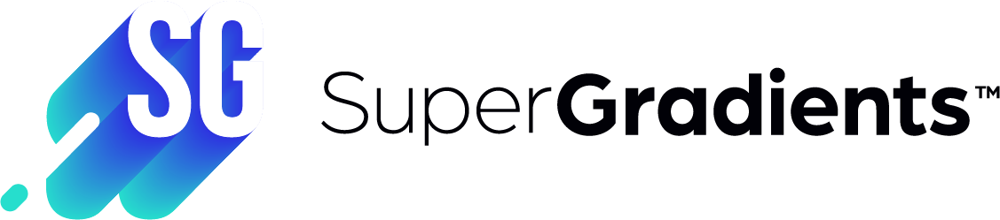

# SuperGradients Semantic Segmentation Quickstart

This short quickstart tutorial uses SuperGradients to:

- Download Supervisely semantic segmentation dataset

- Build PPLiteSeg model

- Train and evaluate it on Supervisely dataset

## Install SuperGradients

In [1]:
! pip install https://deci-pretrained-models.s3.amazonaws.com/super_gradients-1.8.0rc4308l-py3-none-any.whl gwpy &> /dev/null

## Download supervisely dataset

Feel free to change the download path by editing SUPERVISELY_DATASET_DOWNLOAD_PATH

In [2]:
import os

SUPERVISELY_DATASET_DOWNLOAD_PATH="/home/data"

supervisely_dataset_dir_path = SUPERVISELY_DATASET_DOWNLOAD_PATH + os.path.sep + 'supervisely-persons'

if os.path.isdir(supervisely_dataset_dir_path):
    print('supervisely dataset already downloaded...')
else:
    print('Downloading and extracting supervisely dataset to: ' + SUPERVISELY_DATASET_DOWNLOAD_PATH)
    ! mkdir $SUPERVISELY_DATASET_DOWNLOAD_PATH
    %cd $SUPERVISELY_DATASET_DOWNLOAD_PATH
    ! wget https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
    ! unzip --qq supervisely-persons.zip

/home/data
--2022-09-13 09:10:50--  https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
Resolving deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)... 3.5.16.110
Connecting to deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)|3.5.16.110|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3564001012 (3.3G) [application/zip]
Saving to: ‘supervisely-persons.zip’

supervisely-persons 100%[===================>]   3.32G  15.5MB/s    in 3m 54s  

2022-09-13 09:14:44 (14.5 MB/s) - ‘supervisely-persons.zip’ saved [3564001012/3564001012]



## Initiate Dataloaders
The dataloaders are initiated with the default parameters defined in the [yaml](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/dataset_params/supervisely_persons_dataset_params.yaml)
file. Parameters as batch_size, transforms, root_dir and others can be overridden by passing as `dataset_params` and
`dataloader_params`, as implemented bellow.

In [3]:
from super_gradients.training import dataloaders

root_dir = supervisely_dataset_dir_path
batch_size = 8

train_loader = dataloaders.supervisely_persons_train(dataset_params={"root_dir": root_dir}, dataloader_params={"batch_size": batch_size})
valid_loader = dataloaders.supervisely_persons_val(dataset_params={"root_dir": root_dir}, dataloader_params={"batch_size": batch_size})

You did not mention an AWS environment.You can set the environment variable ENVIRONMENT_NAME with one of the values: development,staging,production
quantization_utils -WARNING- Failed to import pytorch_quantization
env_sanity_check -INFO- ** A sanity check is done when importing super_gradients for the first time. **
-> You can see the details by setting the env variable DISPLAY_SANITY_CHECK=True prior to import.


/usr/local/lib/python3.7/dist-packages/super_gradients/training/dataloaders/dataloaders.py:53: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize_config_dir(config_dir=pkg_resources.resource_filename("super_gradients.recipes", "")):
/usr/local/lib/python3.7/dist-packages/super_gradients/training/dataloaders/dataloaders.py:53: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize_config_dir(config_dir=pkg_resources.resource_filename("super_gradients.recipes", "")):


## Initiate PPLiteSeg-T Module
Create a PPLiteSeg nn.Module, with 1 class segmentation head classifier. For simplicity `use_aux_head` is set as `False`
and extra Auxiliary heads aren't used for training.

Other segmentation modules can be used for this task such as, DDRNet, STDC and RegSeg.

Full list of supported architectures
can be found in [all_architectures.py](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/training/models/all_architectures.py)

In [4]:
from super_gradients.training import models

model = models.get(name="pp_lite_t_seg",
                   arch_params={"use_aux_heads": False},
                   num_classes=1)

## Defining Training HyperParameters
Here we define the training recipe. Although most parameters will probably look familiar, be sure to see our documentation of the full [training parameters supported](https://deci-ai.github.io/super-gradients/user_guide.html#training-parameters).

We will be using an average of BCE and Dice loss for segmentation, with different learning rates for the replaced segmentation head layer, and the rest of the network- this is controlled by the `multiply_head_lr` parameter which is the multiplication factor of the learning rate for the newly replaced layer.

As our `metric_to_watch`, we will be monitoring the `target_IOU` which is one of the components of `BinaryIOU` torchmetrics object (the other components are `mean_IOU` which is the mean of the background and target IOUs, and `background_IOU`).

In [5]:
from super_gradients.training.metrics.segmentation_metrics import BinaryIOU
from super_gradients.training.utils.callbacks import BinarySegmentationVisualizationCallback, Phase

train_params = {"max_epochs": 30,
                "lr_mode": "cosine",
                "initial_lr": 0.01,
                "lr_warmup_epochs": 5,
                "multiply_head_lr": 10,
                "optimizer": "SGD",
                "loss": "bce_dice_loss",
                "ema": True,
                "zero_weight_decay_on_bias_and_bn": True,
                "average_best_models": True,
                "metric_to_watch": "target_IOU",
                "greater_metric_to_watch_is_better": True,
                "train_metrics_list": [BinaryIOU()],
                "valid_metrics_list": [BinaryIOU()],
                "loss_logging_items_names": ["loss"],
                "phase_callbacks": [BinarySegmentationVisualizationCallback(phase=Phase.VALIDATION_BATCH_END,
                                                                            freq=1,
                                                                            last_img_idx_in_batch=4)],
                }

# Initiate a Trainer object
We will initialize our **trainer** which will be in charge of everything, like training, evaluation, saving checkpoints, plotting etc.

The **experiment name** argument is important as every checkpoints, logs and tensorboards to be saved in a directory with the same name. This directory will be created as a sub-directory of **ckpt_root_dir** as follow:

```
ckpt_root_dir
|─── experiment_name_1
│       ckpt_best.pth                     # Model checkpoint on best epoch
│       ckpt_latest.pth                   # Model checkpoint on last epoch
│       average_model.pth                 # Model checkpoint averaged over epochs
│       events.out.tfevents.1659878383... # Tensorflow artifacts of a specific run
│       log_Aug07_11_52_48.txt            # Trainer logs of a specific run
└─── experiment_name_2
        ...
```
In this notebook multi-gpu training is set as `OFF`, for Distributed training multi_gpu can be set as
 `MultiGPUMode.DISTRIBUTED_DATA_PARALLEL` or `MultiGPUMode.DATA_PARALLEL`.

In [6]:
from super_gradients.training import Trainer, MultiGPUMode

trainer = Trainer(experiment_name="segmentation_quick_start", multi_gpu=MultiGPUMode.OFF)

# Start training and evaluation
Make sure to visit the IMAGES tab inside tensorboard once every few epochs to see the predictions improvement on some sample images-
- True positive pixels - $\color {green}{\text{segmented in Green}}$
- False positive pixels - $\color {blue}{\text{segmented in Blue}}$ 
- False negative pixels - $\color {red}{\text{segmented in Red}}$

In [7]:
%load_ext tensorboard
%tensorboard --logdir /home/data/checkpoints/segmentation_quick_start --bind_all

<IPython.core.display.Javascript object>

In [8]:
trainer.train(model=model, training_params=train_params, train_loader=train_loader, valid_loader=valid_loader)

sg_trainer -INFO- Using EMA with params {}
sg_trainer -INFO- Started training for 30 epochs (0/29)



Train epoch 0:   0%|          | 0/309 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:393: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  FutureWarning)
Validation epoch 0: 100%|██████████| 65/65 [00:15<00:00,  4.16it/s]


SUMMARY OF EPOCH 0
├── Training
│   └── Loss = 0.3879
└── Validation
    ├── Loss = 0.4165
    └── Target_iou = 0.6811

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.6811316609382629


Validation epoch 1: 100%|██████████| 65/65 [00:15<00:00,  4.31it/s]


SUMMARY OF EPOCH 1
├── Training
│   └── Loss = 0.3257
│       ├── Best until now = 0.3879 (↘ -0.0622)
│       └── Epoch N-1      = 0.3879 (↘ -0.0622)
└── Validation
    ├── Loss = 0.3826
    │   ├── Best until now = 0.4165 (↘ -0.0338)
    │   └── Epoch N-1      = 0.4165 (↘ -0.0338)
    └── Target_iou = 0.7071
        ├── Best until now = 0.6811 (↗ 0.0259)
        └── Epoch N-1      = 0.6811 (↗ 0.0259)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7070752382278442


Validation epoch 2: 100%|██████████| 65/65 [00:15<00:00,  4.27it/s]


SUMMARY OF EPOCH 2
├── Training
│   └── Loss = 0.3092
│       ├── Best until now = 0.3257 (↘ -0.0165)
│       └── Epoch N-1      = 0.3257 (↘ -0.0165)
└── Validation
    ├── Loss = 0.3713
    │   ├── Best until now = 0.3826 (↘ -0.0114)
    │   └── Epoch N-1      = 0.3826 (↘ -0.0114)
    └── Target_iou = 0.7184
        ├── Best until now = 0.7071 (↗ 0.0114)
        └── Epoch N-1      = 0.7071 (↗ 0.0114)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7184497714042664


Validation epoch 3: 100%|██████████| 65/65 [00:16<00:00,  3.93it/s]


SUMMARY OF EPOCH 3
├── Training
│   └── Loss = 0.2879
│       ├── Best until now = 0.3092 (↘ -0.0213)
│       └── Epoch N-1      = 0.3092 (↘ -0.0213)
└── Validation
    ├── Loss = 0.3593
    │   ├── Best until now = 0.3713 (↘ -0.012)
    │   └── Epoch N-1      = 0.3713 (↘ -0.012)
    └── Target_iou = 0.7283
        ├── Best until now = 0.7184 (↗ 0.0099)
        └── Epoch N-1      = 0.7184 (↗ 0.0099)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7283319234848022


Validation epoch 4: 100%|██████████| 65/65 [00:15<00:00,  4.30it/s]


SUMMARY OF EPOCH 4
├── Training
│   └── Loss = 0.2763
│       ├── Best until now = 0.2879 (↘ -0.0116)
│       └── Epoch N-1      = 0.2879 (↘ -0.0116)
└── Validation
    ├── Loss = 0.3569
    │   ├── Best until now = 0.3593 (↘ -0.0024)
    │   └── Epoch N-1      = 0.3593 (↘ -0.0024)
    └── Target_iou = 0.7284
        ├── Best until now = 0.7283 (↗ 0.0001)
        └── Epoch N-1      = 0.7283 (↗ 0.0001)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7284334301948547


Validation epoch 5: 100%|██████████| 65/65 [00:15<00:00,  4.28it/s]


SUMMARY OF EPOCH 5
├── Training
│   └── Loss = 0.2773
│       ├── Best until now = 0.2763 (↗ 0.0011)
│       └── Epoch N-1      = 0.2763 (↗ 0.0011)
└── Validation
    ├── Loss = 0.3492
    │   ├── Best until now = 0.3569 (↘ -0.0077)
    │   └── Epoch N-1      = 0.3569 (↘ -0.0077)
    └── Target_iou = 0.7329
        ├── Best until now = 0.7284 (↗ 0.0045)
        └── Epoch N-1      = 0.7284 (↗ 0.0045)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.732891321182251


Validation epoch 6: 100%|██████████| 65/65 [00:15<00:00,  4.26it/s]


SUMMARY OF EPOCH 6
├── Training
│   └── Loss = 0.269
│       ├── Best until now = 0.2763 (↘ -0.0073)
│       └── Epoch N-1      = 0.2773 (↘ -0.0084)
└── Validation
    ├── Loss = 0.3225
    │   ├── Best until now = 0.3492 (↘ -0.0267)
    │   └── Epoch N-1      = 0.3492 (↘ -0.0267)
    └── Target_iou = 0.7541
        ├── Best until now = 0.7329 (↗ 0.0212)
        └── Epoch N-1      = 0.7329 (↗ 0.0212)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7540579438209534


Validation epoch 7: 100%|██████████| 65/65 [00:15<00:00,  4.19it/s]


SUMMARY OF EPOCH 7
├── Training
│   └── Loss = 0.2523
│       ├── Best until now = 0.269  (↘ -0.0167)
│       └── Epoch N-1      = 0.269  (↘ -0.0167)
└── Validation
    ├── Loss = 0.3173
    │   ├── Best until now = 0.3225 (↘ -0.0052)
    │   └── Epoch N-1      = 0.3225 (↘ -0.0052)
    └── Target_iou = 0.7549
        ├── Best until now = 0.7541 (↗ 0.0008)
        └── Epoch N-1      = 0.7541 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7548814415931702


Validation epoch 8: 100%|██████████| 65/65 [00:15<00:00,  4.27it/s]


SUMMARY OF EPOCH 8
├── Training
│   └── Loss = 0.253
│       ├── Best until now = 0.2523 (↗ 0.0007)
│       └── Epoch N-1      = 0.2523 (↗ 0.0007)
└── Validation
    ├── Loss = 0.3207
    │   ├── Best until now = 0.3173 (↗ 0.0035)
    │   └── Epoch N-1      = 0.3173 (↗ 0.0035)
    └── Target_iou = 0.7517
        ├── Best until now = 0.7549 (↘ -0.0032)
        └── Epoch N-1      = 0.7549 (↘ -0.0032)



Validation epoch 9: 100%|██████████| 65/65 [00:15<00:00,  4.10it/s]


SUMMARY OF EPOCH 9
├── Training
│   └── Loss = 0.2423
│       ├── Best until now = 0.2523 (↘ -0.01)
│       └── Epoch N-1      = 0.253  (↘ -0.0107)
└── Validation
    ├── Loss = 0.3019
    │   ├── Best until now = 0.3173 (↘ -0.0154)
    │   └── Epoch N-1      = 0.3207 (↘ -0.0188)
    └── Target_iou = 0.7653
        ├── Best until now = 0.7549 (↗ 0.0104)
        └── Epoch N-1      = 0.7517 (↗ 0.0136)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.765278697013855


Validation epoch 10: 100%|██████████| 65/65 [00:15<00:00,  4.29it/s]


SUMMARY OF EPOCH 10
├── Training
│   └── Loss = 0.2358
│       ├── Best until now = 0.2423 (↘ -0.0065)
│       └── Epoch N-1      = 0.2423 (↘ -0.0065)
└── Validation
    ├── Loss = 0.2957
    │   ├── Best until now = 0.3019 (↘ -0.0062)
    │   └── Epoch N-1      = 0.3019 (↘ -0.0062)
    └── Target_iou = 0.7715
        ├── Best until now = 0.7653 (↗ 0.0062)
        └── Epoch N-1      = 0.7653 (↗ 0.0062)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7714504599571228


Validation epoch 11: 100%|██████████| 65/65 [00:15<00:00,  4.28it/s]


SUMMARY OF EPOCH 11
├── Training
│   └── Loss = 0.2329
│       ├── Best until now = 0.2358 (↘ -0.0029)
│       └── Epoch N-1      = 0.2358 (↘ -0.0029)
└── Validation
    ├── Loss = 0.2886
    │   ├── Best until now = 0.2957 (↘ -0.0072)
    │   └── Epoch N-1      = 0.2957 (↘ -0.0072)
    └── Target_iou = 0.7761
        ├── Best until now = 0.7715 (↗ 0.0047)
        └── Epoch N-1      = 0.7715 (↗ 0.0047)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7761337161064148


Validation epoch 12: 100%|██████████| 65/65 [00:15<00:00,  4.29it/s]


SUMMARY OF EPOCH 12
├── Training
│   └── Loss = 0.2282
│       ├── Best until now = 0.2329 (↘ -0.0047)
│       └── Epoch N-1      = 0.2329 (↘ -0.0047)
└── Validation
    ├── Loss = 0.2909
    │   ├── Best until now = 0.2886 (↗ 0.0023)
    │   └── Epoch N-1      = 0.2886 (↗ 0.0023)
    └── Target_iou = 0.7754
        ├── Best until now = 0.7761 (↘ -0.0007)
        └── Epoch N-1      = 0.7761 (↘ -0.0007)



Validation epoch 13: 100%|██████████| 65/65 [00:15<00:00,  4.26it/s]


SUMMARY OF EPOCH 13
├── Training
│   └── Loss = 0.2257
│       ├── Best until now = 0.2282 (↘ -0.0026)
│       └── Epoch N-1      = 0.2282 (↘ -0.0026)
└── Validation
    ├── Loss = 0.2893
    │   ├── Best until now = 0.2886 (↗ 0.0007)
    │   └── Epoch N-1      = 0.2909 (↘ -0.0016)
    └── Target_iou = 0.7766
        ├── Best until now = 0.7761 (↗ 0.0004)
        └── Epoch N-1      = 0.7754 (↗ 0.0012)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7765805125236511


Validation epoch 14: 100%|██████████| 65/65 [00:15<00:00,  4.32it/s]


SUMMARY OF EPOCH 14
├── Training
│   └── Loss = 0.2192
│       ├── Best until now = 0.2257 (↘ -0.0065)
│       └── Epoch N-1      = 0.2257 (↘ -0.0065)
└── Validation
    ├── Loss = 0.2845
    │   ├── Best until now = 0.2886 (↘ -0.0041)
    │   └── Epoch N-1      = 0.2893 (↘ -0.0048)
    └── Target_iou = 0.78
        ├── Best until now = 0.7766 (↗ 0.0034)
        └── Epoch N-1      = 0.7766 (↗ 0.0034)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.780018150806427


Validation epoch 15: 100%|██████████| 65/65 [00:15<00:00,  4.28it/s]


SUMMARY OF EPOCH 15
├── Training
│   └── Loss = 0.2189
│       ├── Best until now = 0.2192 (↘ -0.0002)
│       └── Epoch N-1      = 0.2192 (↘ -0.0002)
└── Validation
    ├── Loss = 0.2815
    │   ├── Best until now = 0.2845 (↘ -0.003)
    │   └── Epoch N-1      = 0.2845 (↘ -0.003)
    └── Target_iou = 0.7825
        ├── Best until now = 0.78   (↗ 0.0025)
        └── Epoch N-1      = 0.78   (↗ 0.0025)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7825408577919006


Validation epoch 16: 100%|██████████| 65/65 [00:15<00:00,  4.30it/s]


SUMMARY OF EPOCH 16
├── Training
│   └── Loss = 0.2154
│       ├── Best until now = 0.2189 (↘ -0.0036)
│       └── Epoch N-1      = 0.2189 (↘ -0.0036)
└── Validation
    ├── Loss = 0.2792
    │   ├── Best until now = 0.2815 (↘ -0.0022)
    │   └── Epoch N-1      = 0.2815 (↘ -0.0022)
    └── Target_iou = 0.7845
        ├── Best until now = 0.7825 (↗ 0.002)
        └── Epoch N-1      = 0.7825 (↗ 0.002)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7844949960708618


Validation epoch 17: 100%|██████████| 65/65 [00:15<00:00,  4.30it/s]


SUMMARY OF EPOCH 17
├── Training
│   └── Loss = 0.2087
│       ├── Best until now = 0.2154 (↘ -0.0066)
│       └── Epoch N-1      = 0.2154 (↘ -0.0066)
└── Validation
    ├── Loss = 0.2776
    │   ├── Best until now = 0.2792 (↘ -0.0016)
    │   └── Epoch N-1      = 0.2792 (↘ -0.0016)
    └── Target_iou = 0.7859
        ├── Best until now = 0.7845 (↗ 0.0014)
        └── Epoch N-1      = 0.7845 (↗ 0.0014)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7858833074569702


Validation epoch 18: 100%|██████████| 65/65 [00:15<00:00,  4.25it/s]


SUMMARY OF EPOCH 18
├── Training
│   └── Loss = 0.2026
│       ├── Best until now = 0.2087 (↘ -0.0061)
│       └── Epoch N-1      = 0.2087 (↘ -0.0061)
└── Validation
    ├── Loss = 0.277
    │   ├── Best until now = 0.2776 (↘ -0.0006)
    │   └── Epoch N-1      = 0.2776 (↘ -0.0006)
    └── Target_iou = 0.7864
        ├── Best until now = 0.7859 (↗ 0.0005)
        └── Epoch N-1      = 0.7859 (↗ 0.0005)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7863765358924866


Validation epoch 19: 100%|██████████| 65/65 [00:15<00:00,  4.31it/s]


SUMMARY OF EPOCH 19
├── Training
│   └── Loss = 0.2034
│       ├── Best until now = 0.2026 (↗ 0.0007)
│       └── Epoch N-1      = 0.2026 (↗ 0.0007)
└── Validation
    ├── Loss = 0.276
    │   ├── Best until now = 0.277  (↘ -0.001)
    │   └── Epoch N-1      = 0.277  (↘ -0.001)
    └── Target_iou = 0.787
        ├── Best until now = 0.7864 (↗ 0.0006)
        └── Epoch N-1      = 0.7864 (↗ 0.0006)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7869901657104492


Validation epoch 20: 100%|██████████| 65/65 [00:16<00:00,  3.96it/s]


SUMMARY OF EPOCH 20
├── Training
│   └── Loss = 0.1999
│       ├── Best until now = 0.2026 (↘ -0.0027)
│       └── Epoch N-1      = 0.2034 (↘ -0.0034)
└── Validation
    ├── Loss = 0.275
    │   ├── Best until now = 0.276  (↘ -0.001)
    │   └── Epoch N-1      = 0.276  (↘ -0.001)
    └── Target_iou = 0.7877
        ├── Best until now = 0.787  (↗ 0.0007)
        └── Epoch N-1      = 0.787  (↗ 0.0007)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7877180576324463


Validation epoch 21: 100%|██████████| 65/65 [00:15<00:00,  4.28it/s]


SUMMARY OF EPOCH 21
├── Training
│   └── Loss = 0.195
│       ├── Best until now = 0.1999 (↘ -0.005)
│       └── Epoch N-1      = 0.1999 (↘ -0.005)
└── Validation
    ├── Loss = 0.274
    │   ├── Best until now = 0.275  (↘ -0.001)
    │   └── Epoch N-1      = 0.275  (↘ -0.001)
    └── Target_iou = 0.7885
        ├── Best until now = 0.7877 (↗ 0.0008)
        └── Epoch N-1      = 0.7877 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7885268330574036


Validation epoch 22: 100%|██████████| 65/65 [00:15<00:00,  4.29it/s]


SUMMARY OF EPOCH 22
├── Training
│   └── Loss = 0.1936
│       ├── Best until now = 0.195  (↘ -0.0014)
│       └── Epoch N-1      = 0.195  (↘ -0.0014)
└── Validation
    ├── Loss = 0.273
    │   ├── Best until now = 0.274  (↘ -0.001)
    │   └── Epoch N-1      = 0.274  (↘ -0.001)
    └── Target_iou = 0.7893
        ├── Best until now = 0.7885 (↗ 0.0007)
        └── Epoch N-1      = 0.7885 (↗ 0.0007)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.789276123046875


Validation epoch 23: 100%|██████████| 65/65 [00:15<00:00,  4.26it/s]


SUMMARY OF EPOCH 23
├── Training
│   └── Loss = 0.1913
│       ├── Best until now = 0.1936 (↘ -0.0023)
│       └── Epoch N-1      = 0.1936 (↘ -0.0023)
└── Validation
    ├── Loss = 0.272
    │   ├── Best until now = 0.273  (↘ -0.001)
    │   └── Epoch N-1      = 0.273  (↘ -0.001)
    └── Target_iou = 0.7901
        ├── Best until now = 0.7893 (↗ 0.0008)
        └── Epoch N-1      = 0.7893 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7900882363319397


Validation epoch 24: 100%|██████████| 65/65 [00:15<00:00,  4.30it/s]


SUMMARY OF EPOCH 24
├── Training
│   └── Loss = 0.1869
│       ├── Best until now = 0.1913 (↘ -0.0043)
│       └── Epoch N-1      = 0.1913 (↘ -0.0043)
└── Validation
    ├── Loss = 0.2709
    │   ├── Best until now = 0.272  (↘ -0.001)
    │   └── Epoch N-1      = 0.272  (↘ -0.001)
    └── Target_iou = 0.7909
        ├── Best until now = 0.7901 (↗ 0.0008)
        └── Epoch N-1      = 0.7901 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7909092307090759


Validation epoch 25: 100%|██████████| 65/65 [00:15<00:00,  4.27it/s]


SUMMARY OF EPOCH 25
├── Training
│   └── Loss = 0.1876
│       ├── Best until now = 0.1869 (↗ 0.0007)
│       └── Epoch N-1      = 0.1869 (↗ 0.0007)
└── Validation
    ├── Loss = 0.2698
    │   ├── Best until now = 0.2709 (↘ -0.0011)
    │   └── Epoch N-1      = 0.2709 (↘ -0.0011)
    └── Target_iou = 0.7918
        ├── Best until now = 0.7909 (↗ 0.0008)
        └── Epoch N-1      = 0.7909 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7917541861534119


Validation epoch 26: 100%|██████████| 65/65 [00:15<00:00,  4.28it/s]


SUMMARY OF EPOCH 26
├── Training
│   └── Loss = 0.1919
│       ├── Best until now = 0.1869 (↗ 0.005)
│       └── Epoch N-1      = 0.1876 (↗ 0.0042)
└── Validation
    ├── Loss = 0.2687
    │   ├── Best until now = 0.2698 (↘ -0.0011)
    │   └── Epoch N-1      = 0.2698 (↘ -0.0011)
    └── Target_iou = 0.7926
        ├── Best until now = 0.7918 (↗ 0.0009)
        └── Epoch N-1      = 0.7918 (↗ 0.0009)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7926385998725891


Validation epoch 27: 100%|██████████| 65/65 [00:15<00:00,  4.27it/s]


SUMMARY OF EPOCH 27
├── Training
│   └── Loss = 0.1897
│       ├── Best until now = 0.1869 (↗ 0.0028)
│       └── Epoch N-1      = 0.1919 (↘ -0.0022)
└── Validation
    ├── Loss = 0.2676
    │   ├── Best until now = 0.2687 (↘ -0.0011)
    │   └── Epoch N-1      = 0.2687 (↘ -0.0011)
    └── Target_iou = 0.7935
        ├── Best until now = 0.7926 (↗ 0.0008)
        └── Epoch N-1      = 0.7926 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7934712171554565


Validation epoch 28: 100%|██████████| 65/65 [00:15<00:00,  4.30it/s]


SUMMARY OF EPOCH 28
├── Training
│   └── Loss = 0.1854
│       ├── Best until now = 0.1869 (↘ -0.0015)
│       └── Epoch N-1      = 0.1897 (↘ -0.0043)
└── Validation
    ├── Loss = 0.2664
    │   ├── Best until now = 0.2676 (↘ -0.0012)
    │   └── Epoch N-1      = 0.2676 (↘ -0.0012)
    └── Target_iou = 0.7943
        ├── Best until now = 0.7935 (↗ 0.0009)
        └── Epoch N-1      = 0.7935 (↗ 0.0009)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7943254709243774


Validation epoch 29: 100%|██████████| 65/65 [00:15<00:00,  4.32it/s]


SUMMARY OF EPOCH 29
├── Training
│   └── Loss = 0.1848
│       ├── Best until now = 0.1854 (↘ -0.0006)
│       └── Epoch N-1      = 0.1854 (↘ -0.0006)
└── Validation
    ├── Loss = 0.2652
    │   ├── Best until now = 0.2664 (↘ -0.0011)
    │   └── Epoch N-1      = 0.2664 (↘ -0.0011)
    └── Target_iou = 0.7952
        ├── Best until now = 0.7943 (↗ 0.0008)
        └── Epoch N-1      = 0.7943 (↗ 0.0008)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7951550483703613
sg_trainer -INFO- RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...


Validation epoch 30: 100%|██████████| 65/65 [00:15<00:00,  4.28it/s]

SUMMARY OF EPOCH 30
├── Training
│   └── Loss = 0.1848
│       ├── Best until now = 0.1854 (↘ -0.0006)
│       └── Epoch N-1      = 0.1854 (↘ -0.0006)
└── Validation
    ├── Loss = 0.2704
    │   ├── Best until now = 0.2652 (↗ 0.0051)
    │   └── Epoch N-1      = 0.2652 (↗ 0.0051)
    └── Target_iou = 0.7913
        ├── Best until now = 0.7952 (↘ -0.0039)
        └── Epoch N-1      = 0.7952 (↘ -0.0039)



In [9]:
print("Best Checkpoint mIoU is: "+ str(trainer.best_metric.item()))

Best Checkpoint mIoU is: 0.7951550483703613


Now you can download your trained weights from this directory

In [10]:
print(trainer.checkpoints_dir_path)

/home/data/checkpoints/segmentation_quick_start


## Predict

As the training was complete you can use the trained model to predict on your data

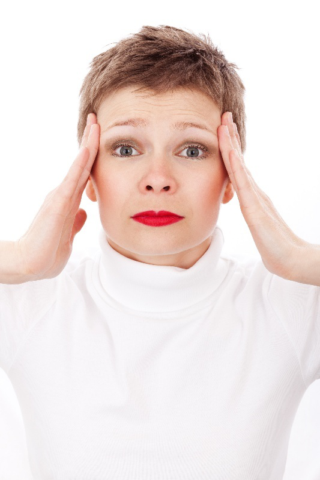

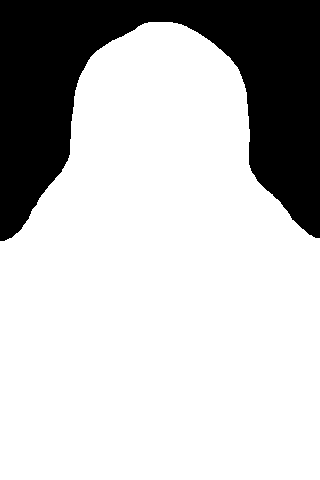

In [13]:
from torchvision.transforms import Compose, ToTensor, Resize, Normalize, ToPILImage
from PIL import Image
import torch

pre_proccess = Compose([
    ToTensor(),
    Normalize([.485, .456, .406], [.229, .224, .225])
])

demo_img_path = "/home/data/supervisely-persons/images/ache-adult-depression-expression-41253.png"
img = Image.open(demo_img_path)
# Resize the image and display
img = Resize(size=(480, 320))(img)
display(img)

# Run pre-proccess - transforms to tensor and apply normalizations.
img = pre_proccess(img).unsqueeze(0).cuda()

# Run inference
model = trainer.net
model = model.eval()
mask = model(img)

# Run post-proccess - apply sigmoid to output probabilities, then apply hard
# threshold of 0.5 for binary mask prediction. 
mask = torch.sigmoid(mask).gt(0.5).squeeze()
mask = ToPILImage()(mask.float())
display(mask)


## Convert to ONNX

In [14]:
! pip install onnx-simplifier &> /dev/null

In [18]:
from onnxsim import simplify
import onnx

input_size = [1, 3, 480, 320]
onnx_path = "/home/data/model.onnx"

model = trainer.net.module.cpu()
model.prep_model_for_conversion(input_size=input_size)

torch.onnx.export(model,
                  torch.randn(*input_size),
                  onnx_path,
                  opset_version=11)

# onnx simplifier
model_sim, check = simplify(onnx_path)
assert check, "Simplified ONNX model could not be validated"
onnx.save_model(model_sim, onnx_path)

print("ONNX successfully created at: ", onnx_path)


ONNX successfully created at:  /home/data/model.onnx
